In [5]:
import pandas as pd
import os
import matplotlib.pyplot as plt
#from holidays import country_holidays
import holidays
import itertools
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import STL
import seaborn as sns
import scipy.stats as stats
import interpret
import pyod
from pyod.models.knn import KNN
from pyod.models.lof import LOF
from pyod.models.iforest import IForest
from pyod.models.ecod import ECOD
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import math 
from sktime.forecasting.ets import AutoETS
from sktime.utils.plotting import plot_series
from sktime.forecasting.arima import AutoARIMA
from interpret.glassbox import ExplainableBoostingRegressor
from sktime.forecasting.base import ForecastingHorizon
import calplot


%matplotlib inline

In [6]:
#read in the data
data = pd.read_csv("sickness_table.csv")

In [5]:
print(data.head())

   Unnamed: 0        date  n_sick   calls  n_duty  n_sby  sby_need  dafted
0           0  2016-04-01      73  8154.0    1700     90       4.0     0.0
1           1  2016-04-02      64  8526.0    1700     90      70.0     0.0
2           2  2016-04-03      68  8088.0    1700     90       0.0     0.0
3           3  2016-04-04      71  7044.0    1700     90       0.0     0.0
4           4  2016-04-05      63  7236.0    1700     90       0.0     0.0


In [7]:
#cleaning
data.drop(data.columns[0], axis = 1, inplace = True)
data["date"] = pd.to_datetime(data["date"])

print(data.head())

        date  n_sick   calls  n_duty  n_sby  sby_need  dafted
0 2016-04-01      73  8154.0    1700     90       4.0     0.0
1 2016-04-02      64  8526.0    1700     90      70.0     0.0
2 2016-04-03      68  8088.0    1700     90       0.0     0.0
3 2016-04-04      71  7044.0    1700     90       0.0     0.0
4 2016-04-05      63  7236.0    1700     90       0.0     0.0


In [7]:
print('The dataset contains values dates between {} and {}.'.format(min(data.date), max(data.date)))


The dataset contains values dates between 2016-04-01 00:00:00 and 2019-05-27 00:00:00.


### Sanity checks

- The number of standby drivers should always be 90
- There should be no duplicate dates
- If additional drivers had to be recruited (dafted) they have to add up to the number of standby drivers needed
- No missing values
- Datatypes are inferred appropriately


In [7]:
print(data["n_sby"].unique())

[90]


 The number of sby drivers is always 90.

In [8]:
print(data.duplicated(subset=["date"]).any())


False


There are no duplicate dates.

In [9]:
dafted_subset = data[data["dafted"] > 0]
print(pd.Series(dafted_subset["sby_need"] == dafted_subset["dafted"] + 90).unique())

[ True]


Dafted and sby drivers add up to the number of sby drivers needed on a given day.

In [10]:
print(data.isnull().any())

date        False
n_sick      False
calls       False
n_duty      False
n_sby       False
sby_need    False
dafted      False
dtype: bool


There are no missing values

In [11]:
print(data.dtypes)

date        datetime64[ns]
n_sick               int64
calls              float64
n_duty               int64
n_sby                int64
sby_need           float64
dafted             float64
dtype: object


Datatypes look fair

## EDA & Feature engineering

First, a general view of the data will be provided below.
According to the client, there is seasonality in the data.
This will be investigated further by performing a seasonal decomposition on the outcome variable, i.e., the number of sby drivers required.

In [9]:
# derive some more features for handling and data exploration
data["sby_perc_activ"] =  data["sby_need"] / data["n_sby"]
data["sby_required"] = data["sby_need"] > 0
data["sby_required_and_sufficient"] = (data["sby_perc_activ"] > 0) & (data["sby_perc_activ"] <= 1.0)
data["sby_insufficient"] = data["dafted"] > 0
data["day_of_month"] = data["date"].dt.day
data["weekday"] = data["date"].dt.day_of_week
data["weekday_name"] = data["date"].dt.day_name()
data["month"] = data["date"].dt.month
data["month_name"] = data["date"].dt.month_name()
data["year"] = data["date"].dt.year
data["is_weekend"] = (data["weekday_name"] == "Saturday") | (data["weekday_name"] == "Sunday")
data["log_sby_need"] = np.log(data["sby_need"] + 1)
data["log_n_sick"] = np.log(data["n_sick"] + 1)

#print(data.head())

        date  n_sick   calls  n_duty  n_sby  sby_need  dafted   seasonal  \
0 2016-04-01      73  8154.0    1700     90       4.0     0.0  -9.588303   
1 2016-04-02      64  8526.0    1700     90      70.0     0.0  28.617887   
2 2016-04-03      68  8088.0    1700     90       0.0     0.0 -12.022766   
3 2016-04-04      71  7044.0    1700     90       0.0     0.0  -6.792594   
4 2016-04-05      63  7236.0    1700     90       0.0     0.0   9.509516   

       trend      resid  ...  sby_required_and_sufficient  sby_insufficient  \
0  20.037748  -6.449444  ...                         True             False   
1  16.973335  24.408778  ...                         True             False   
2  14.079620  -2.056855  ...                        False             False   
3  11.330640  -4.538046  ...                        False             False   
4   8.663335 -18.172850  ...                        False             False   

   day_of_month  weekday  weekday_name  month month_name  year is_we

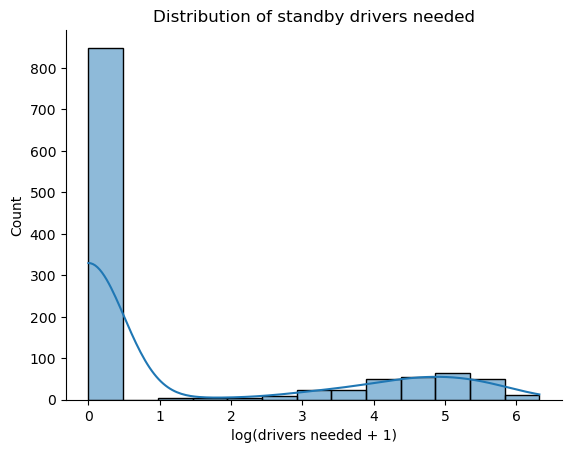

In [49]:
fig, ax = plt.subplots()
ax = sns.histplot(data = data, x = "log_sby_need", kde = True,)

ax.set_title("Distribution of standby drivers needed")
ax.set_xlabel("log(drivers needed + 1)")
sns.despine()


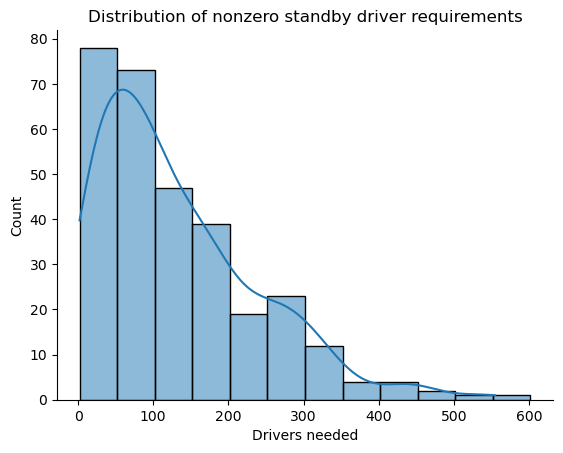

In [44]:
fig, ax = plt.subplots()
ax = sns.histplot(x = data[data["sby_need"] > 0].sby_need, kde = True,
                 binwidth = 50)

ax.set_title("Distribution of nonzero standby driver requirements")
ax.set_xlabel("Drivers needed")
sns.despine()


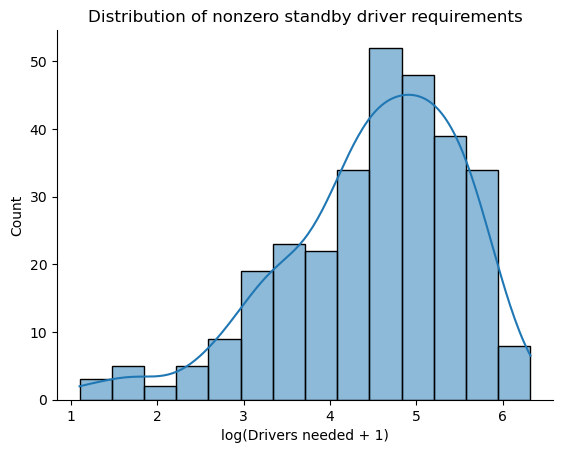

In [48]:
fig, ax = plt.subplots()
ax = sns.histplot(x = data[data["log_sby_need"] > 0].log_sby_need, kde = True,
                 )

ax.set_title("Distribution of nonzero standby driver requirements")
ax.set_xlabel("log(Drivers needed + 1)")
sns.despine()


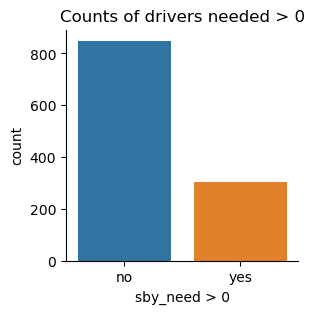

In [39]:
fig, ax = plt.subplots(figsize = (3,3))
ax = sns.countplot(data = data, x = "sby_required",
                  )

ax.set_title("Counts of drivers needed > 0")
ax.set_xlabel("sby_need > 0")
ax.set_xticks([0,1], labels = ["no", "yes"])
sns.despine()


The outcome variable is highly skewed and zero-inflated.

Next, it is possible that the number of required sby drivers depends on the number of sick drivers.
Plots showing the distribution of the number of sick drivers per day of the week, or per month, or per day of the week when stratified per month will be included in the appendix for the case that this information becomes interesting for the client at some point. 
The number of sick people remains constant throughout the weekdays and days of the month.
The highest number of sick people is in September and October. 

Most importantly, however, the number of sick drivers is not significantly correlated with the number of sby drivers required as can be seen in the following figure. 


Text(0.5, 1.25, 'Drivers needed vs. number of sick drivers')

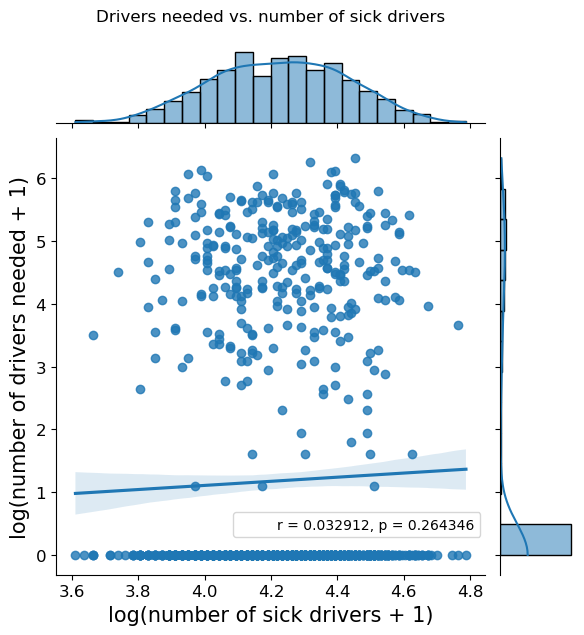

In [11]:

ax = sns.jointplot(data = data,
            x = "log_n_sick",
            y = "log_sby_need",
            kind = "reg",)

# https://stackoverflow.com/questions/52118245/python-seaborn-jointplot-does-not-show-the-correlation-coefficient-and-p-value-o
r, p = stats.pearsonr(data["log_n_sick"], data["log_sby_need"])
phantom, = ax.ax_joint.plot([], [], linestyle = "", alpha = 1)
ax.ax_joint.legend([phantom], ["r = {:f}, p = {:f}".format(r, p)], loc = "lower center", 
           fontsize = 10,
           bbox_to_anchor = (0.7, 0.07))

ax.ax_joint.tick_params(axis = "both", labelsize = 12)

ax.set_axis_labels("log(number of sick drivers + 1)", "log(number of drivers needed + 1)",
                   fontsize = 15)
ax.ax_joint.set_title("Drivers needed vs. number of sick drivers",
                      y = 1.25)

### sby driver requirements in time




(<Figure size 1250x680 with 5 Axes>,
 array([<AxesSubplot:ylabel='2016'>, <AxesSubplot:ylabel='2017'>,
        <AxesSubplot:ylabel='2018'>, <AxesSubplot:ylabel='2019'>],
       dtype=object))

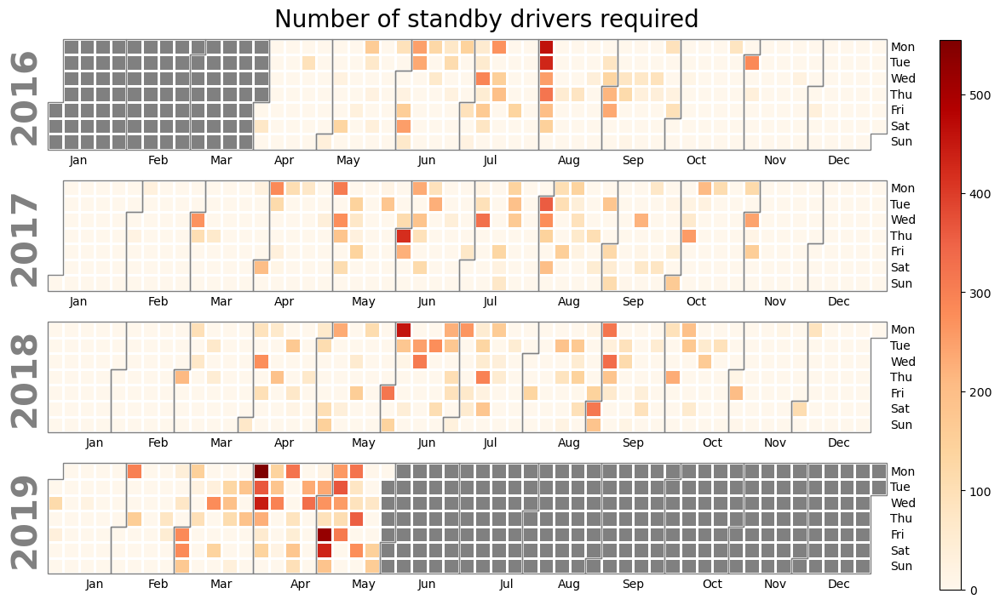

In [13]:
calplot.calplot(data.set_index("date")["sby_need"], cmap='OrRd',
                suptitle = "Number of standby drivers required",
                suptitle_kws = {"size": 20},
                fillcolor = "grey",
                dropzero = False,
                colorbar=True)

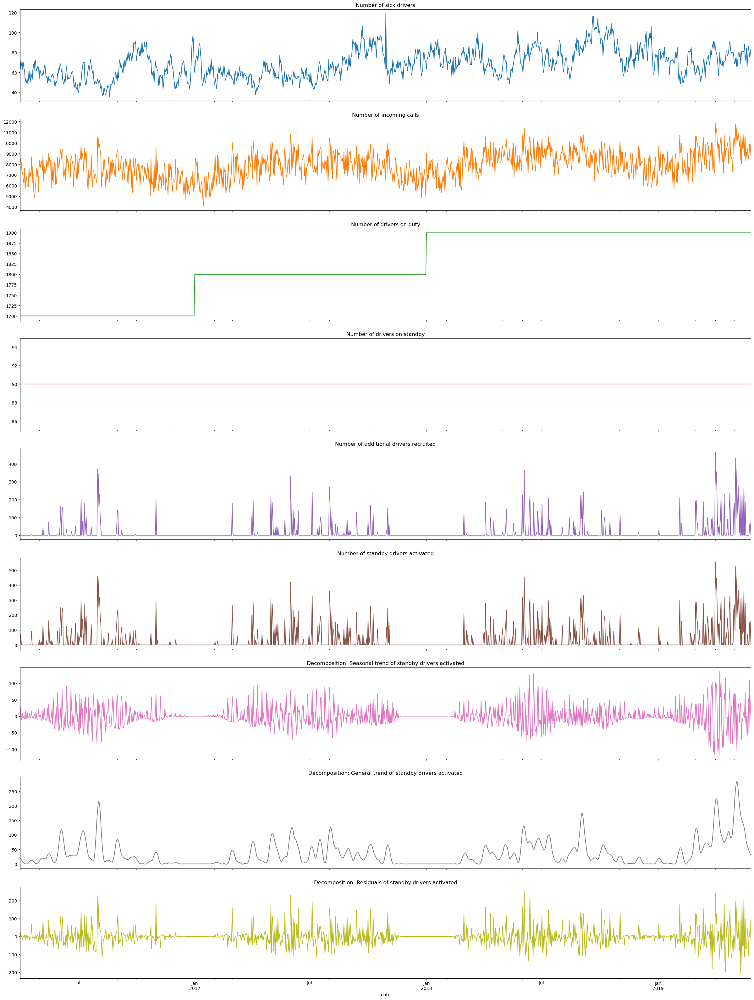

In [14]:
# LOESS STL decomposition

data.set_index("date", inplace = True)

#decompose
result = STL(data.sby_need).fit()
data["seasonal"] = result.seasonal
data["trend"] = result.trend
data["resid"] = result.resid

#plotting
column_order = ["n_sick", "calls", "n_duty", "n_sby", "dafted", "sby_need", "seasonal", "trend", "resid"]
titles = ["Number of sick drivers",
         "Number of incoming calls",
         "Number of drivers on duty",
         "Number of drivers on standby",
         "Number of additional drivers recruited",
         "Number of standby drivers activated",
         "Decomposition: Seasonal trend of standby drivers activated",
         "Decomposition: General trend of standby drivers activated",
         "Decomposition: Residuals of standby drivers activated"]

data.loc[:, column_order].plot(subplots=True,
                               figsize=(30,40),
                               title = titles,
                               legend = False,                               
                              )

data.reset_index(inplace = True)

The data clearly shows seasonal patterns in the numbers of calls received, sick drivers, additional drivers recruited as well as sby drivers activated.
The number of sick drivers appears to have yearly peaks in September/October, while the number of calls received, additional drivers recruited as well as sby drivers activated peak somewhere in the middle of the year.
Furthermore, the decomposition of the time series suggests that there are "seasonal" fluctuations in the data which may reflect changes over the course of the week.
Moreover, considering the "general trend" portion of the data, it appears that there might be recurring fluctuations throughout each month, with higher numbers of sby drivers required at the beginning of each month.
Lastly, there might be a trends towards higher number of sby drivers being activated throughout the years in general, although this only seems apparent when comparing the most recent data from 2019 with the data from previous years. 

Next, the data will be investigated in more detail.

In [24]:
def plot_stratified_month(df, y = "sby_need", log_scale = False,
                         suptitle = "Number of standby drivers needed per day of the month"):
    """
    function to plot the number of sby drivers stratified by month
    """
    
    fig, axes = plt.subplots(3,4, figsize = (60,40), sharey = False)

    for i, ax in enumerate(axes.flat):

        individual_vals = df[df["month"] == i + 1]

        sns.boxplot(x = individual_vals["day_of_month"], 
                    y = individual_vals[y], 
                    fliersize = 0, 
                    ax = ax,
                    palette = "Blues")
    
        sns.stripplot(x = individual_vals["day_of_month"], 
                      y = individual_vals[y],
                      ax = ax, size = 12,
                      jitter = True, color = "black")
    
        ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                     size = 40, fontweight = "bold")
        ax.set_xlabel("Day of the month", size = 30, labelpad = 20)
        ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
        sns.despine()
        sns.set_theme(font_scale = 2, style = "white")
        ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
                   label = "current policy: 90 drivers")
        ax.legend()
        if log_scale:
            ax.set_yscale("log") #comment in or out for scale

    fig.suptitle(suptitle,
                 fontsize = 100, fontweight = "bold", y = 1.01)

    fig.tight_layout(pad = 2.0)
    
    

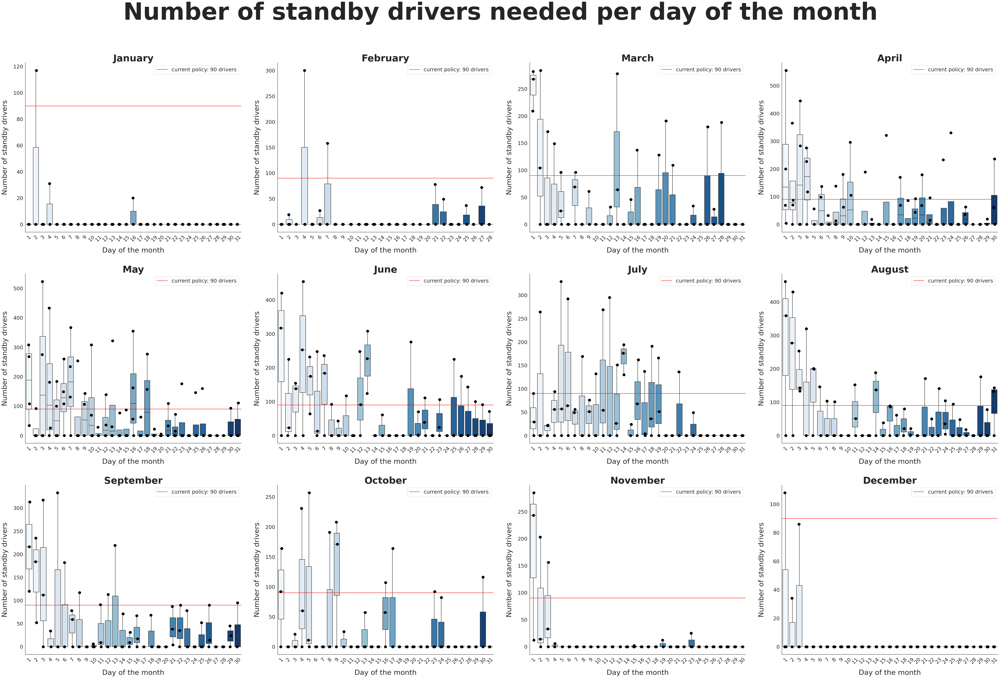

In [25]:
plot_stratified_month(data)

There is strong evidence for seasonality in the number of drivers needed. 

In the winter months, the number of sby drivers needed were substantially lower than during the rest of the year, and most drivers wre required during the spring and summer months.
In fact, it appears that sby drivers were required at all during winter months, only in very rare events.

Furthermore, it is very notable that more sby drivers were required at the beginning of each month than in the second half of the month.

Lastly, given the distribution of this variable, it could make sense to apply a log transformation to the data when modelling. 
The figure above can be plotted on log scale using the log_scale = True argument.
Plotting the same figure on the log scale did not yield any further insights, thus I chose not to display it since it may make it more difficult to understand the figure for red cross workers who are not used to interpreting data on such a scale.

Let us visualize the above a bit further, starting with a figure showing how often sby drivers were required at all, independent of how many.

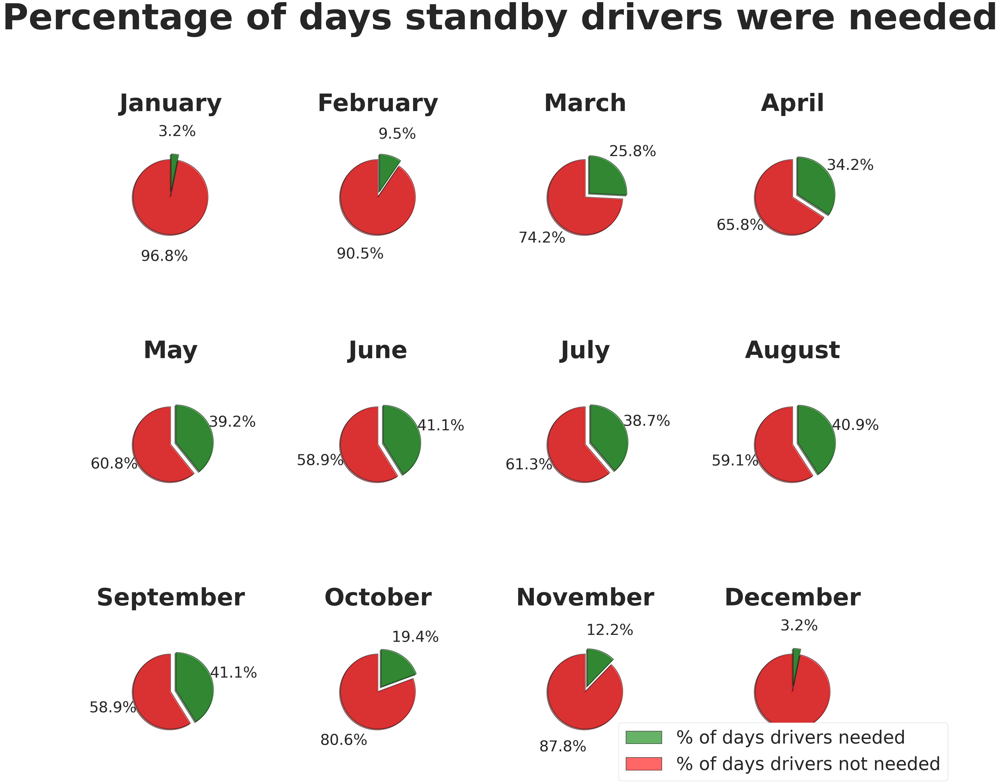

In [17]:
fig, axes = plt.subplots(3,4, figsize = (40, 40), sharey = False)

for i, ax in enumerate(axes.flat):

    individual_vals = data[data["month"] == i + 1]
    percent_true = individual_vals.groupby("month_name").mean()["sby_required"][0]
    percent_false = 1 - percent_true
    percentages = [percent_true, percent_false]
    
    ax.pie(x = percentages, 
           labels = ["% of days drivers needed", 
                     "% of days drivers not needed"], 
           colors = ["green", "red"],
           textprops = {"fontsize": 50}, 
           wedgeprops = {"edgecolor": "black", "linewidth": "2", "alpha": 0.6},
           counterclock = False, 
           autopct = "%1.1f%%",
           pctdistance = 1.6,
           startangle = 90, 
           labeldistance = None,
           explode = [0.15, 0],
           shadow = True,)
           
    ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                  size = 80, fontweight = "bold", y = 1.4)
    

ax.legend(loc = "lower center", 
           fontsize = 60,
           bbox_to_anchor = (0.4, -0.55),
           framealpha = 1)

fig.suptitle("Percentage of days standby drivers were needed",
             fontsize = 120, fontweight = "bold", y = 0.98, x = 0.5)

fig.tight_layout(pad = 2.0, w_pad = 1, h_pad = 0.2)

In January and December sby drivers were only required on ~ 3 % of the days, while they were required about 40 % of the days in May to September. 
Considering these data, it could make sense to minimize the number of sby drivers during January and December, potentially not even deploying any at all.

Furthermore, any potential classification approach to predict the appearance of nonzero driver requirements could benefit from oversampling the apparent minority class which is days on which sby drivers are needed.

Now, let's marginalize over all months, and see whether the trend for an increased number of sby drivers required at the beginning of the month may be true for the whole year.  

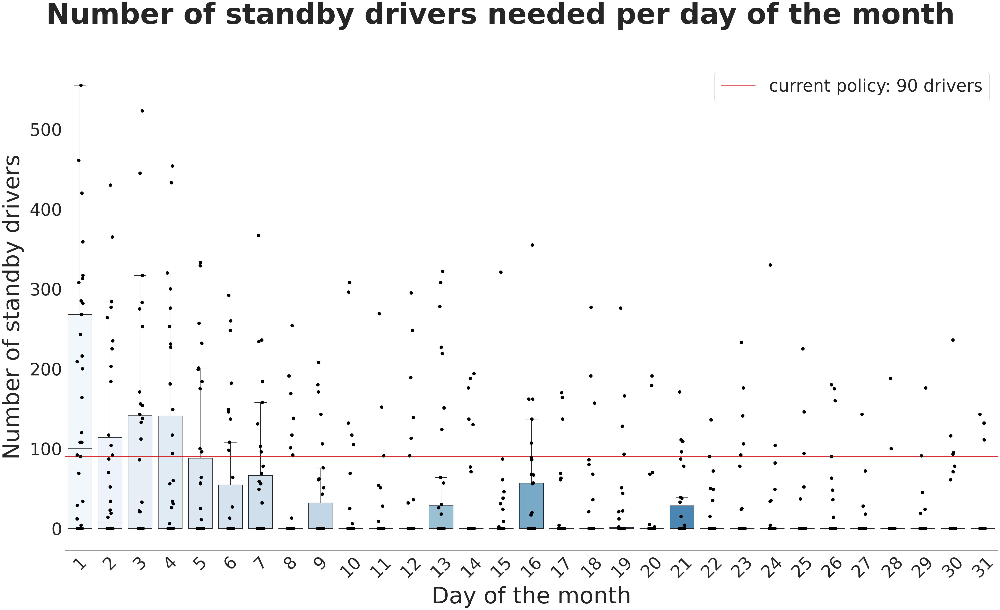

In [18]:
fig, ax = plt.subplots(figsize = (50, 30))

sns.boxplot(x = data["day_of_month"], 
            y = data["sby_need"], 
            fliersize = 0, 
            ax = ax,
            palette = "Blues")
    
sns.stripplot(x = data["day_of_month"], 
              y = data["sby_need"],
              ax = ax, size = 12,
              jitter = True, color = "black")

ax.set_xlabel("Day of the month", size = 80, labelpad = 20)
ax.set_ylabel("Number of standby drivers", size = 80, labelpad = 20)
plt.yticks(fontsize = 60)
ax.set_xticklabels(ax.get_xticklabels(), fontsize = 60, rotation = 45)
sns.despine()
sns.set_theme(font_scale = 2, style = "white")
ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
ax.legend(fontsize = 60)
#ax.set_yscale("log") # comment in or out for log scale on/off

fig.suptitle("Number of standby drivers needed per day of the month",
             fontsize = 100, fontweight = "bold", y = 1.01)
fig.tight_layout(pad = 2.0)

Indeed, there is a clear trend for higher number of sby drivers being required at the beginning of the months.
Notably, the first day of the month has been the the only day of the month on which more than 90 sby drivers were required most of the time.

Is there a significant correlation between the day of the month and the number of sby drivers required?

In [19]:
print(stats.pearsonr(data["day_of_month"], data["sby_need"]))
print(stats.spearmanr(data["day_of_month"], data["sby_need"]))
print(stats.kendalltau(data["day_of_month"], data["sby_need"]))


(-0.2825382211004256, 1.383254699025961e-22)
SpearmanrResult(correlation=-0.25368100353401873, pvalue=2.244019847648628e-18)
KendalltauResult(correlation=-0.19799295171342227, pvalue=5.16357341921756e-18)


All three considered metrics indicate a significant, yet rather weak negative correlation, indicating that the number of sby drivers decreases over the course of a month.

Next, let's investigate how the number of required sby drivers depends on the day of the week.

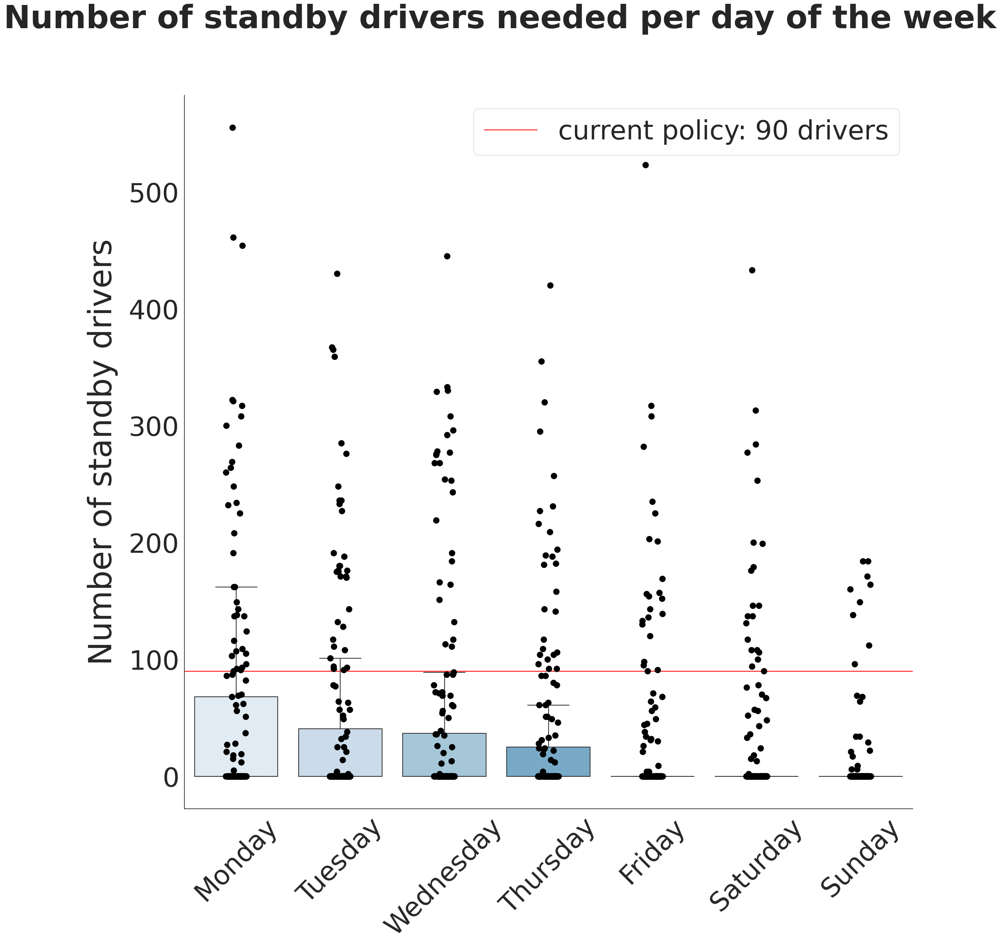

In [20]:
fig, ax = plt.subplots(figsize = (23, 25))

sns.boxplot(x = data["weekday_name"], 
            y = data["sby_need"], 
            fliersize = 0, 
            order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
            ax = ax,
            palette = "Blues")
    
sns.stripplot(x = data["weekday_name"], 
              y = data["sby_need"],
              order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
              ax = ax, size = 12,
              jitter = True, color = "black")

ax.set_xlabel("")
ax.set_ylabel("Number of standby drivers", size = 60, labelpad = 20)
plt.yticks(fontsize = 50)
ax.set_xticklabels(ax.get_xticklabels(), fontsize = 50, rotation = 45)
sns.despine()
sns.set_theme(font_scale = 2, style = "white")
ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
ax.legend(fontsize = 50)
#ax.set_yscale("log")

fig.suptitle("Number of standby drivers needed per day of the week",
             fontsize = 60, fontweight = "bold", y = 1.01)
fig.tight_layout(pad = 2.0)

In [21]:
print(stats.pearsonr(data["weekday"], data["sby_need"]))
print(stats.spearmanr(data["weekday"], data["sby_need"]))
print(stats.kendalltau(data["weekday"], data["sby_need"]))

print("\nCorrelation for is_weekend")
print(stats.pointbiserialr(data["is_weekend"], data["sby_need"]))

(-0.15392486869298355, 1.5207557900627453e-07)
SpearmanrResult(correlation=-0.14678661705542395, pvalue=5.620490171878018e-07)
KendalltauResult(correlation=-0.12042753278552668, pvalue=5.71283699519059e-07)

Correlation for is_weekend
PointbiserialrResult(correlation=-0.12770150895274646, pvalue=1.3773696947876322e-05)


Intriguingly, most sby drivers are required during the early week, and correlation coefficients indicate a significant correlation that is rather weak in magnitude. 

Further, weekends have a weak negative, yet significant correlation with the number of sby drivers required. Perhaps, the indicator variable is_weekend could be used in the modelling process later. Importantly, however, it will be highly correlated with a hot-encoded Saturday or Sunday indicator variables, so there might be some redundancy that should be avoided by not including all of these features at the same time.


For now, let us investigate further, and see whether this pattern of decreasing number of required sby drivers is constant over all months. 

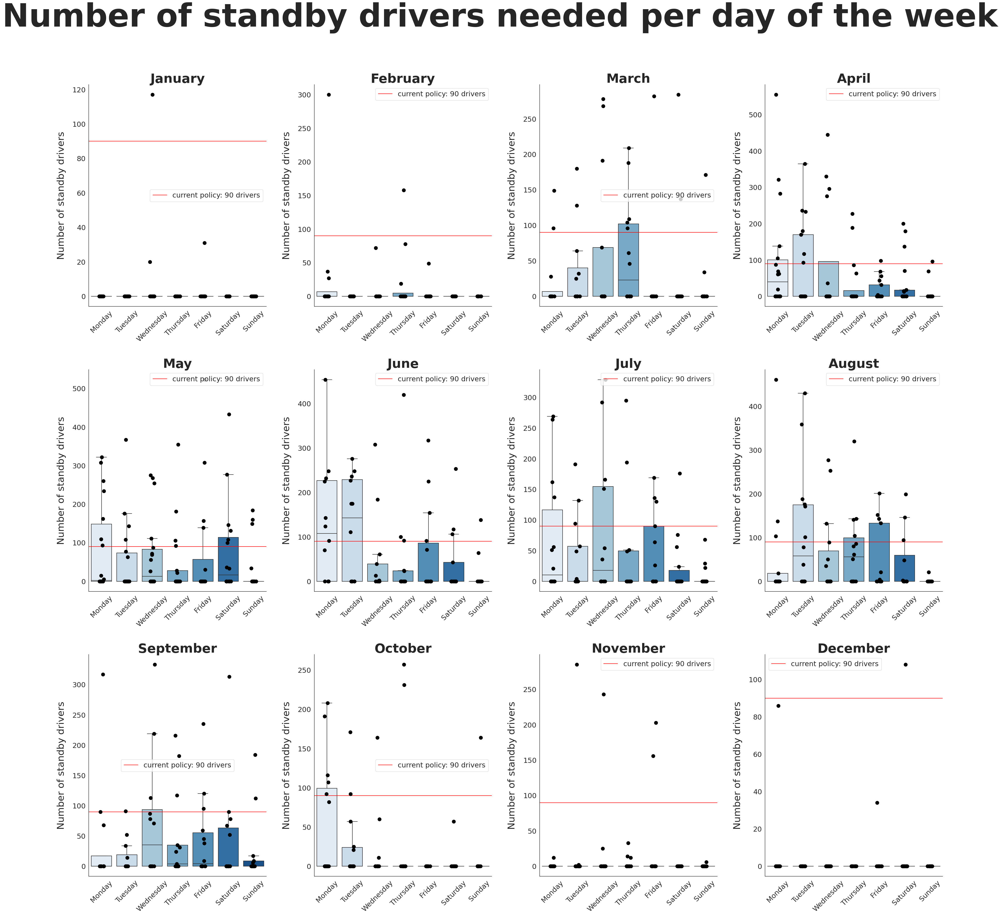

In [7]:
fig, axes = plt.subplots(3,4, figsize = (40,40), sharey = False)

for i, ax in enumerate(axes.flat):

    individual_vals = data[data["month"] == i + 1]

    sns.boxplot(x = individual_vals["weekday_name"], 
                y = individual_vals["sby_need"], 
                fliersize = 0, 
                order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                ax = ax,
                palette = "Blues")
    
    sns.stripplot(x = individual_vals["weekday_name"], 
                  y = individual_vals["sby_need"], 
                  order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                  ax = ax, size = 12,
                  jitter = True, color = "black")
    
    ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold")
    ax.set_xlabel("")
    ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")
    ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
    ax.legend()
    #ax.set_yscale("log")


fig.suptitle("Number of standby drivers needed per day of the week",
             fontsize = 100, fontweight = "bold", y = 1.01)
fig.tight_layout(pad = 2.0)


When stratifying the data per month, it is less clear whether most sby_drivers were required on Mondays of each month.
However, in general it appears that most sby drivers were required during weekdays, and rarely during the weekend.

Again, it is striking that nearly no sby drivers were required during the winter months. 
Given these insights, it may make sense to include interaction effects between the months and days during the modeling phase.

Next, the general trend over the years will be investigated. 

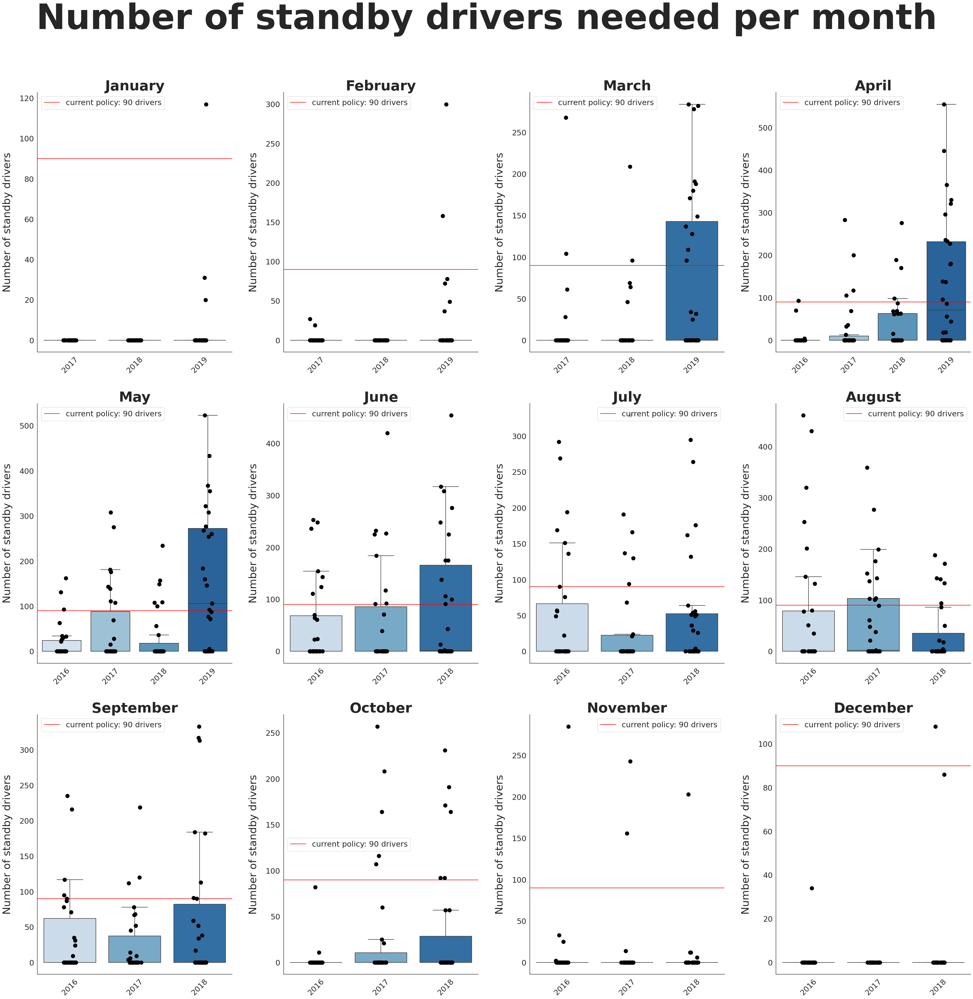

In [8]:
fig, axes = plt.subplots(3,4, figsize = (40,40), sharey = False)

for i, ax in enumerate(axes.flat):

    individual_vals = data[data["month"] == i + 1]

    sns.boxplot(x = individual_vals["year"], 
                y = individual_vals["sby_need"], 
                fliersize = 0,
                ax = ax,
                palette = "Blues")
    
    sns.stripplot(x = individual_vals["year"], 
                  y = individual_vals["sby_need"], 
                  ax = ax, size = 12,
                  jitter = True, color = "black")
    
    ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold")
    ax.set_xlabel("")
    ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")
    ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
    ax.legend()
    #ax.set_yscale("log")


fig.suptitle("Number of standby drivers needed per month",
             fontsize = 100, fontweight = "bold", y = 1.01)
fig.tight_layout(pad = 2.0)


how does the data look if you exclude the zero values?

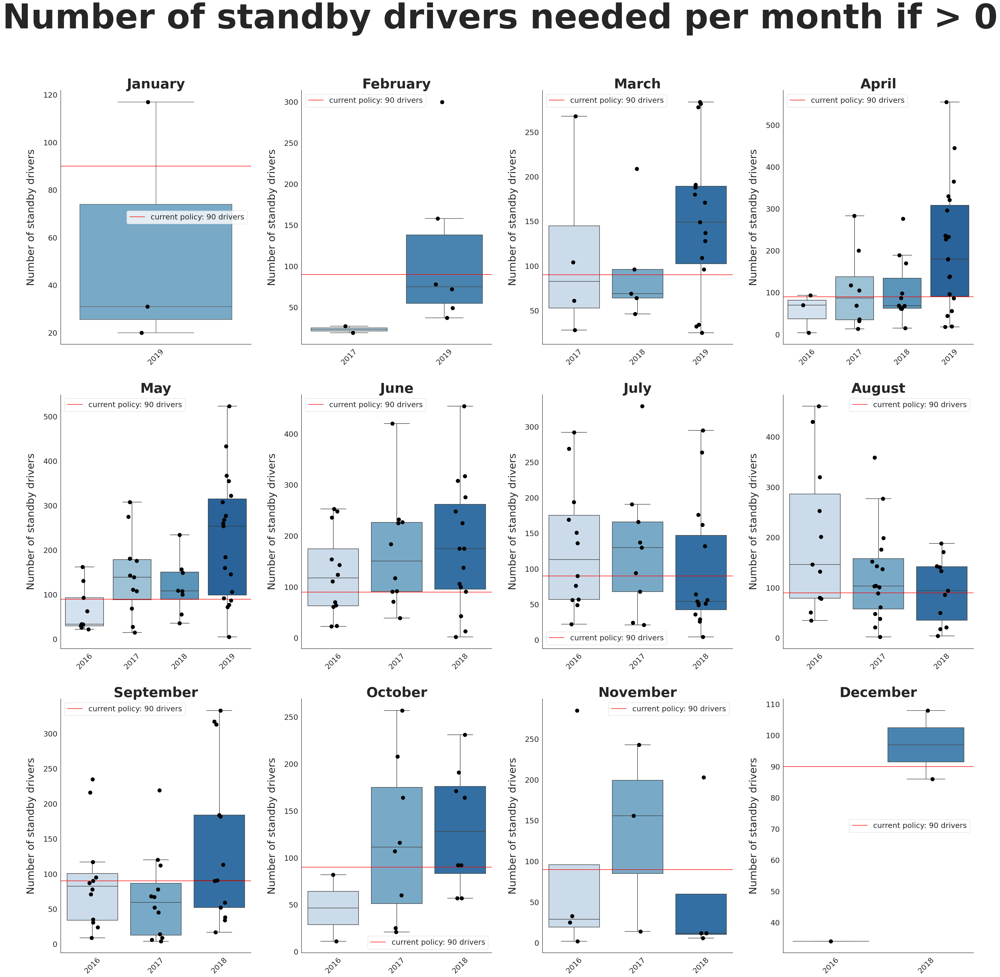

In [11]:
fig, axes = plt.subplots(3,4, figsize = (40,40), sharey = False)

for i, ax in enumerate(axes.flat):

    individual_vals = data[data["month"] == i + 1]
    individual_vals = individual_vals[individual_vals["sby_required"] == True]

    sns.boxplot(x = individual_vals["year"], 
                y = individual_vals["sby_need"], 
                fliersize = 0,
                ax = ax,
                palette = "Blues")
    
    sns.stripplot(x = individual_vals["year"], 
                  y = individual_vals["sby_need"], 
                  ax = ax, size = 12,
                  jitter = True, color = "black")
    
    ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold")
    ax.set_xlabel("")
    ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")
    ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
    ax.legend()
    #ax.set_yscale("log")


fig.suptitle("Number of standby drivers needed per month if > 0",
             fontsize = 100, fontweight = "bold", y = 1.01)
fig.tight_layout(pad = 2.0)


It becomes apparent that the distribution of the data changes for some months that could make precise predictions difficult.
Here some of the most easy to spot things:

- 2019 is the first year where drivers were required in January. This could make predicting them difficult.
- No drivers were required in February 2018. This could lead to overpredictions there.
- Way more drivers were required in March, April and May 2019. I expect a higher prediction errors here.
- August 2016 appears too high. Could lead to high error in 2017
- September 2018 could become difficult to predict well given the days with high number of drivers being required
- October 2016 has small number of days where drivers are required and the amount of drivers required is lower compared to the following years. The 2017 prediction could become difficult.
- November 2017 might be an outlier that could be difficult to predict based on historic data.
- The driver requirements of December 2018 will not be predictable.

According to the data, a general trend towards higher sby driver requirements throughout the years may be possible. 
Maybe this is more apparent when 12-month bins are considered. 
Since the data from 2016 and 2019 are incomplete, 12-month long periods starting in June and ending in May will be plotted next to increase the amount of data available. 

Text(0.5, 1.01, 'Sby drivers required over the last three 12-month periods')

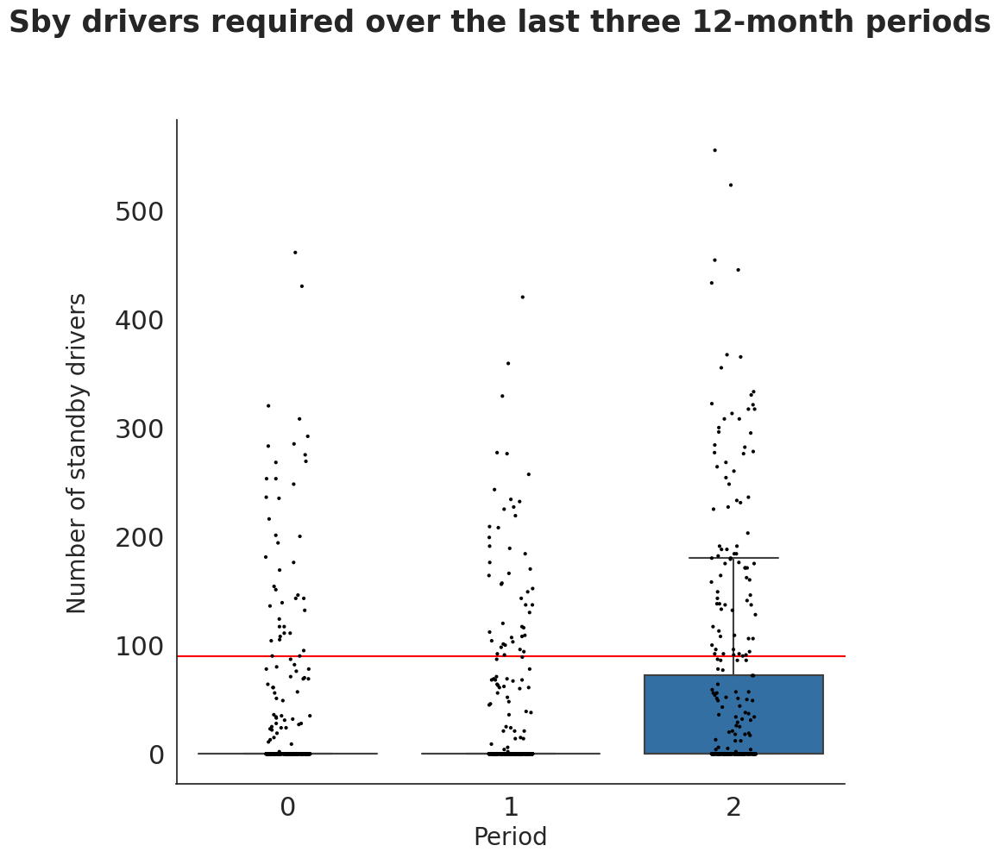

In [24]:
period_0 = data[(data["date"] >= "2016-06-01") & (data["date"] <= "2017-05-31")].loc[:, ["sby_need"]].reset_index().drop(columns = "index")
period_0["12_month_period"] = 0

period_1 = data[(data["date"] >= "2017-06-01") & (data["date"] <= "2018-05-31")].loc[:, ["sby_need"]].reset_index().drop(columns = "index")
period_1["12_month_period"] = 1

period_2 = data[(data["date"] >= "2018-06-01") & (data["date"] <= "2019-05-31")].loc[:, ["sby_need"]].reset_index().drop(columns = "index")
period_2["12_month_period"] = 2

periods_df = pd.concat([period_0, period_1, period_2])


fig, ax = plt.subplots(figsize = (10,10))

sns.boxplot(x = periods_df["12_month_period"],
            y = periods_df["sby_need"],
            fliersize = 0,
            ax = ax,
            palette = "Blues")
    
sns.stripplot(x = periods_df["12_month_period"],
              y = periods_df["sby_need"],
              size = 3,
              ax = ax,
              jitter = True, color = "black")

ax.set_xlabel("Period", fontsize = 20)
ax.set_ylabel("Number of standby drivers", size = 20, labelpad = 20)
#ax.set_xticklabels(ax.get_xticklabels(), fontsize = 12)
#ax.set_yticklabels(ax.get_yticklabels(), fontsize = 12)
sns.despine()
sns.set_theme(font_scale = 2, style = "white")
ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
            label = "current policy: 90 drivers")
#ax.legend(fontsize = 15)
    
fig.suptitle("Sby drivers required over the last three 12-month periods",
             fontsize = 25, fontweight = "bold", y = 1.01)

#ax.set_yscale("log")


In [25]:
print(stats.pearsonr(periods_df["12_month_period"], periods_df["sby_need"]))
print(stats.spearmanr(periods_df["12_month_period"], periods_df["sby_need"]))
print(stats.kendalltau(periods_df["12_month_period"], periods_df["sby_need"]))

print("\nData without the last year: ")
print(stats.pearsonr(periods_df[periods_df["12_month_period"] < 2]["12_month_period"], 
                     periods_df[periods_df["12_month_period"] < 2]["sby_need"]))
print(stats.spearmanr(periods_df[periods_df["12_month_period"] < 2]["12_month_period"], 
                      periods_df[periods_df["12_month_period"] < 2]["sby_need"]))
print(stats.kendalltau(periods_df[periods_df["12_month_period"] < 2]["12_month_period"], 
                       periods_df[periods_df["12_month_period"] < 2]["sby_need"]))

(0.14214526702255284, 2.4329334161077465e-06)
SpearmanrResult(correlation=0.14022312243269391, pvalue=3.3308077949793027e-06)
KendalltauResult(correlation=0.12365242527125637, pvalue=3.649604352789325e-06)

Data without the last year: 
(-0.002265660995260943, 0.9512716329950978)
SpearmanrResult(correlation=0.009756540653513364, pvalue=0.7924259205687445)
KendalltauResult(correlation=0.00923212303716403, pvalue=0.7922217923843402)


According to the figure and the metrics considered, there appears to be a weak, yet statistically significant correlation between the periods and the number of sby drivers required. 
This may reflect a trend towards increasing amounts of sby drivers required.
That said, the trend towards more sby drivers being activated in recent years appears to be mainly driven by the data from period 2 as removing data from that year abolishes the previously found correlation.  
This may either reflect a real underlying, potentially exponential trend in the data generation process, or may constitute a "false positive" trend that could be caused by an "outlier year" given that there is only data available from three years.
Regardless, considering the current epidemic that may have further increased the number of sby drivers required over the last few years, it may be wortwhile adding a trend component during model engineering depending on the models used in the process.

Next, there will be a few attempts in identifying good predictor variables for the number of sby drivers required.

Maybe the number of required sby drivers depends on whether days are public holidays?

In [26]:
# create column indicating public holidays
holidays_berlin = holidays.DE(subdiv = "BE", years = [2016, 2017, 2018, 2019])

#initiate column
data["is_holiday"] = False

#set true if date is holiday
for index in range(len(data["date"])):
    if data.loc[index, "date"] in holidays_berlin:
        data.loc[index, "is_holiday"] = True

print(stats.pointbiserialr(data["is_holiday"], data["sby_need"]))

PointbiserialrResult(correlation=0.027399287508667013, pvalue=0.3528230104829192)


Public holidays are not significantly correlated with the outcome.

Are more drivers required when there are school holidays?

In [27]:
#crate column indicating school holidays
holidays_school = []
holidays_school.append(pd.date_range("2016-04-01", periods = 1)) #Osterferien
holidays_school.append(pd.date_range("2016-05-06", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2016-05-17", periods = 2)) #Pfingstferien
holidays_school.append(pd.date_range("2016-07-21", periods = 2)) #Sommerferien
holidays_school.append(pd.date_range("2016-07-25", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-01", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-01", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-08", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-15", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-22", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-29", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-10-17", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2016-10-24", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2016-12-23", periods = 1)) #Weihnachtsferien
holidays_school.append(pd.date_range("2016-12-27", periods = 4)) #Weihnachtsferien
holidays_school.append(pd.date_range("2017-01-02", periods = 2)) #Weihnachtsferien
holidays_school.append(pd.date_range("2017-01-30", periods = 5)) #Winterferien
holidays_school.append(pd.date_range("2017-04-10", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2017-04-18", periods = 1)) #Osterferien
holidays_school.append(pd.date_range("2017-05-24", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2017-05-26", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2017-06-06", periods = 4)) #Pfingstferien
holidays_school.append(pd.date_range("2017-07-20", periods = 1)) #Sommerferien
holidays_school.append(pd.date_range("2017-07-24", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-07-31", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-01", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-07", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-14", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-21", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-28", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-10-02", periods = 1)) #Herbstferien
holidays_school.append(pd.date_range("2017-10-23", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2017-10-30", periods = 1)) #Herbstferien
holidays_school.append(pd.date_range("2017-11-01", periods = 3)) #Herbstferien
holidays_school.append(pd.date_range("2017-12-21", periods = 2)) #Weihnachtsferien
holidays_school.append(pd.date_range("2017-12-27", periods = 3)) #Weihnachtsferien
holidays_school.append(pd.date_range("2018-01-02", periods = 1)) #Weihnachtsferien
holidays_school.append(pd.date_range("2018-02-05", periods = 5)) #Winterferien
holidays_school.append(pd.date_range("2018-03-26", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2018-04-06", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2018-04-30", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2018-05-11", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2018-05-22", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2018-07-05", periods = 2)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-09", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-16", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-23", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-30", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-08-06", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-08-13", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-10-22", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2018-10-29", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2018-12-24", periods = 1)) #Weihnachtsferien
holidays_school.append(pd.date_range("2018-12-31", periods = 5)) #Weihnachtsferien
holidays_school.append(pd.date_range("2019-02-04", periods = 5)) #Winterferien
holidays_school.append(pd.date_range("2019-04-15", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2019-04-23", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2019-05-31", periods = 1)) #Osterferien

#flatten list
holidays_school = list(itertools.chain(*holidays_school))

data["is_school_holiday"] = False

#set true if date is holiday
for index in range(len(data["date"])):
    if data.loc[index, "date"] in holidays_school:
        data.loc[index, "is_school_holiday"] = True

print(stats.pointbiserialr(data["is_school_holiday"], data["sby_need"]))


PointbiserialrResult(correlation=0.07237734577328264, pvalue=0.014005403851337311)


The number of standby drivers required are weakly, yet significantly correlated with the presence of school holidays.

Is the correlation increased when public holidays are also included in the analysis, i.e., when kids are out of school during weekdays because of public holidays or school holidays?

In [28]:
data["kids_out_of_school"] = data["is_school_holiday"] | data["is_holiday"]

print(stats.pointbiserialr(data["kids_out_of_school"], data["sby_need"]))

PointbiserialrResult(correlation=0.0805547277526879, pvalue=0.006226731662212137)


Yes, there is significant, but weak correlation with the number of sby drivers needed. 
Perhaps, this can be exploited in the modelling process later.

Further potential predictors for the number of sby drivers could could be the occurrence of events such as soccer games of Union Berlin, music festivals etc. 
A subset of dates of such events were manually checked in the data, but the number of sby drivers was zero on all of them which is why no formal correlation analyses of these events were carried out in the following.

Next, the dates of a subset of instances with very high sby driver requirements were searched manually on Google in an attempt to identify a cause, such as events that were not checked previously or other disasters. 
Yet, none could be identified.
Perhaps, the HR department of the red cross can provide context for those dates.
Based on those information, features exploitable in a revised model could potentially be constructed. 
On the other hand, reasons for the exclusion of dates, such as super rare outlier events like disasters, could be identified to improve the modelling process by excluding noise.

Importantly, all potential features corresponding to school holidays, weekdays, soccer events, etc. constitute features that could be used in the present use case for prediction as these are factors that are known far in advance, which is a requirement for all potential features exploitable in the modelling process, as predictions have to be made on the 15th of each month for the whole upcoming month. 
Thus, with a leading time of at least two weeks, accurate information about the presence of acute events or sudden temperature peaks are not available to the the model on the day predictions have to be made.
Therefore, no efforts were undertaken to include them in the current project.




## Outliers

The detection and potential removal of outliers has not been discussed yet. 
One possibility for outlier handling could be the 2-sigma rule, where all datapoints lying outside of mean +- 2 * standard deviation (std) would be discarded. 
When using all available data to calculate the mean and std, we would end up with a threshold of ~ 194 sby drivers to be the cutoff.
Given the nature of the data at hand this would lead to the exclusion of way to many data points. 
Instead, let us investigate how the rule would perform when calculating a threshold for each month individually.

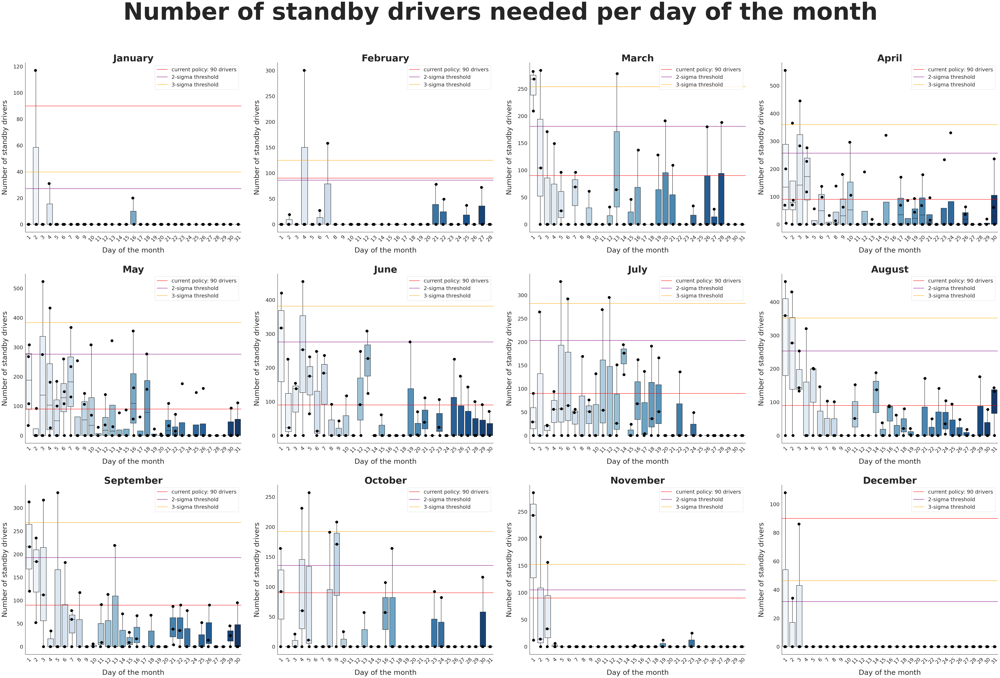

In [33]:

fig, axes = plt.subplots(3,4, figsize = (60,40), sharey = False)

for i, ax in enumerate(axes.flat):

    individual_vals = data[data["month"] == i + 1]

    sns.boxplot(x = individual_vals["day_of_month"], 
                y = individual_vals["sby_need"], 
                fliersize = 0, 
                ax = ax,
                palette = "Blues")
    
    sns.stripplot(x = individual_vals["day_of_month"], 
                  y = individual_vals["sby_need"],
                  ax = ax, size = 12,
                  jitter = True, color = "black")
    
    ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold")
    ax.set_xlabel("Day of the month", size = 30, labelpad = 20)
    ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")
    ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
    
    #plot another line that indicates the 2-sigma threshold of values.
    #values above would be excluded.
    threshold_2 = individual_vals["sby_need"].mean() + 2 * individual_vals["sby_need"].std()
    ax.axhline(y = threshold_2, xmin = 0, xmax = 1, color = "purple",
               label = "2-sigma threshold")
    
    #plot another line that indicates the 3-sigma threshold of values.
    #values above would be excluded.
    threshold_3 = individual_vals["sby_need"].mean() + 3 * individual_vals["sby_need"].std()
    ax.axhline(y = threshold_3, xmin = 0, xmax = 1, color = "orange",
               label = "3-sigma threshold")
    
    ax.legend()
    #ax.set_yscale("log") #comment in or out for scale

fig.suptitle("Number of standby drivers needed per day of the month",
             fontsize = 100, fontweight = "bold", y = 1.01)

fig.tight_layout(pad = 2.0)



Notably, applying the two sigma rule in this manner would result in the preferential removal of datapoints from the beginning of the months. 
Excluding datapoints more conservatively by applying the three sigma rule appears have similar effects.
However, blindly discarding those datapoints by using the 2- or 3-sigma rule could be inappropriate in the first place as those datapoints might be true events occurring due to the data generating process.
Thus, removing those datapoints could actually hurt model performance later.

Another approach could be to use the 2-sigma rule while exclduding all zero-values when calculating the mean and std for the number of sby drivers required since the distribution of the number of sby drivers required appears to be zero-inflated in most of the months. 


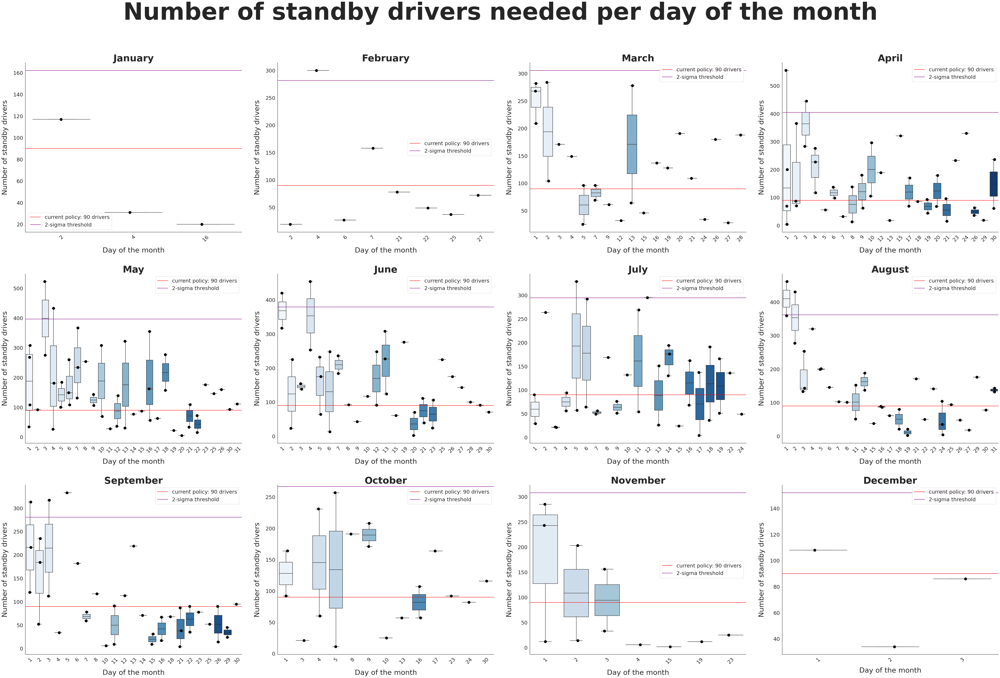

In [34]:


fig, axes = plt.subplots(3,4, figsize = (60,40), sharey = False)

for i, ax in enumerate(axes.flat):

    individual_vals = data[(data["month"] == i + 1) & (data["sby_required"] == True)]

    sns.boxplot(x = individual_vals["day_of_month"], 
                y = individual_vals["sby_need"], 
                fliersize = 0, 
                ax = ax,
                palette = "Blues")
    
    sns.stripplot(x = individual_vals["day_of_month"], 
                  y = individual_vals["sby_need"],
                  ax = ax, size = 12,
                  jitter = True, color = "black")
    
    ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold")
    ax.set_xlabel("Day of the month", size = 30, labelpad = 20)
    ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")
    ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
               label = "current policy: 90 drivers")
    
    #plot another line that indicates the 2-sigma threshold of values.
    #values above would be excluded.
    threshold = individual_vals["sby_need"].mean() + 2 * individual_vals["sby_need"].std()
    ax.axhline(y = threshold, xmin = 0, xmax = 1, color = "purple",
               label = "2-sigma threshold")
    
    ax.legend()
    #ax.set_yscale("log") #comment in or out for scale

fig.suptitle("Number of standby drivers needed per day of the month",
             fontsize = 100, fontweight = "bold", y = 1.01)

fig.tight_layout(pad = 2.0)



However, it seems like this approach also does not solve the previous issue where basically only datapoints from the beginning of the month are discarded. 
Thus, using the stochastic 2-sigma approach may not serve very well.

When interpreting the data in light of the PyOD benchmark paper (https://www.andrew.cmu.edu/user/yuezhao2/papers/22-preprint-adbench.pdf), it seems that a proximity-based approach might perform better on this dataset in an attempt to exclude datapoints that simply are rare "noise" events assumed to be appearing randomly over time. 
In the paper, k Nearest Neighbors (kNN) and Local Outlier Factor (LOF) performed the best for local anomalies. 

In the following, I will test those methods as well as "Outlier Detection Using Empirical Cumulative Distribution Functions" (ECOD) and "iForest", and inspect which timepoints would be preferentially excluded when using those methods.

The plots below show the datapoint which would be excluded colored in red.



In [17]:

def fit_model(model, data, column='sby_need'):
    
    #https://www.analyticsvidhya.com/blog/2021/06/univariate-anomaly-detection-a-walkthrough-in-python/
    
    # fit the model and predict it
    df = data.copy()
    data_to_predict = data[column].to_numpy().reshape(-1, 1)
    predictions = model.fit(data_to_predict).predict(data_to_predict)
    df['Predictions'] = predictions
    
    return df

def plot_anomalies(df, x='date', y='sby_need'):
    
    #https://www.analyticsvidhya.com/blog/2021/06/univariate-anomaly-detection-a-walkthrough-in-python/

    # categories will be having values from 0 to n
    # for each values in 0 to n it is mapped in colormap
    categories = df['Predictions'].to_numpy()
    colormap = np.array(['g', 'r'])

    f = plt.figure(figsize=(12, 4))
    f = plt.scatter(df[x], df[y], c=colormap[categories])
    f = plt.xlabel(x)
    f = plt.ylabel(y)
    f = plt.xticks(rotation=90)
    plt.show()

def plot_anomalies_stratified(df, x='date', y='sby_need'):



    fig, axes = plt.subplots(3,4, figsize = (60,40), sharey = False)

    for i, ax in enumerate(axes.flat):

        individual_vals = df[df["month"] == i + 1]
        
        # categories will be having values from 0 to n
        # for each values in 0 to n it is mapped in colormap
        categories = individual_vals['Predictions'].to_numpy()
        colormap = np.array(['black', 'red'])

        sns.boxplot(x = individual_vals["day_of_month"], 
                    y = individual_vals["sby_need"], 
                    fliersize = 0, 
                    ax = ax,
                    palette = "Blues")
    
        sns.scatterplot(x = individual_vals["day_of_month"] - 1, 
                      y = individual_vals["sby_need"],
                      ax = ax, c=colormap[categories],
                       s = 50)
    
        ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                     size = 40, fontweight = "bold")
        ax.set_xlabel("Day of the month", size = 30, labelpad = 20)
        ax.set_ylabel("Number of standby drivers", size = 30, labelpad = 20)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
        sns.despine()
        sns.set_theme(font_scale = 2, style = "white")
        ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
                   label = "current policy: 90 drivers")
       
        ax.legend()
        #ax.set_yscale("log") #comment in or out for scale

    fig.suptitle("Number of standby drivers needed per day of the month",
                 fontsize = 100, fontweight = "bold", y = 1.01)

    fig.tight_layout(pad = 2.0)
    
    


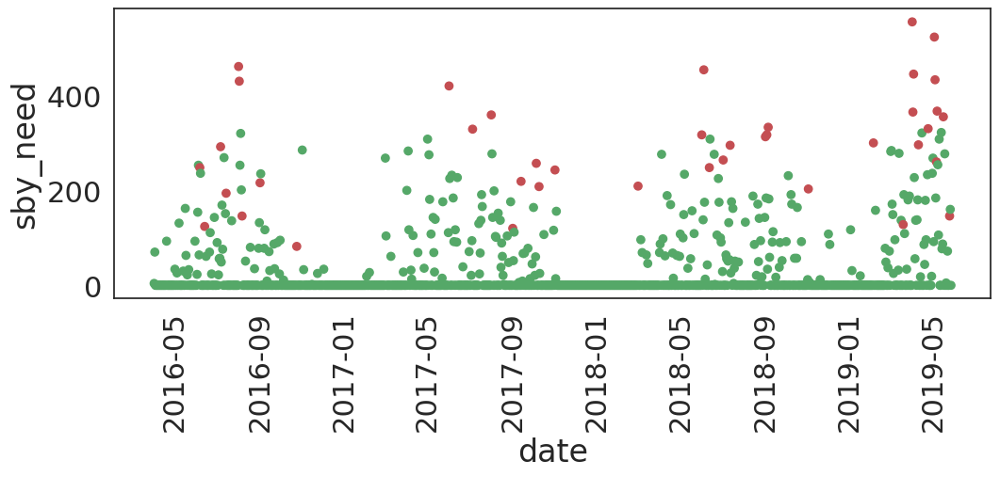

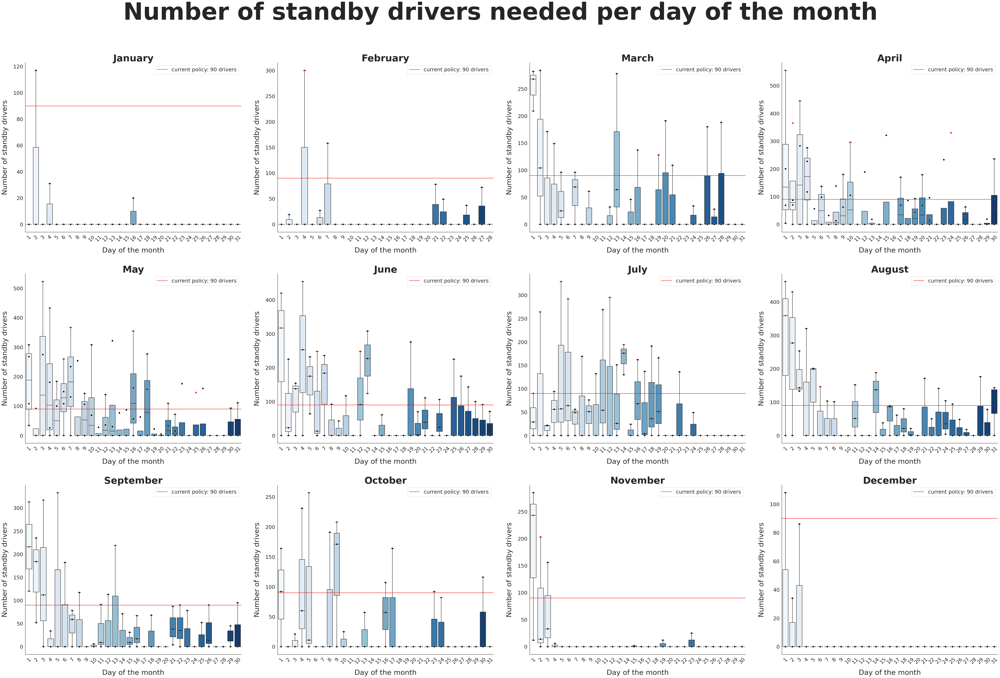

In [18]:
knn_model = KNN(n_neighbors = 3) #kNN also has the contamination parameter..
knn_df = fit_model(knn_model, data)
plot_anomalies(knn_df)
plot_anomalies_stratified(knn_df)

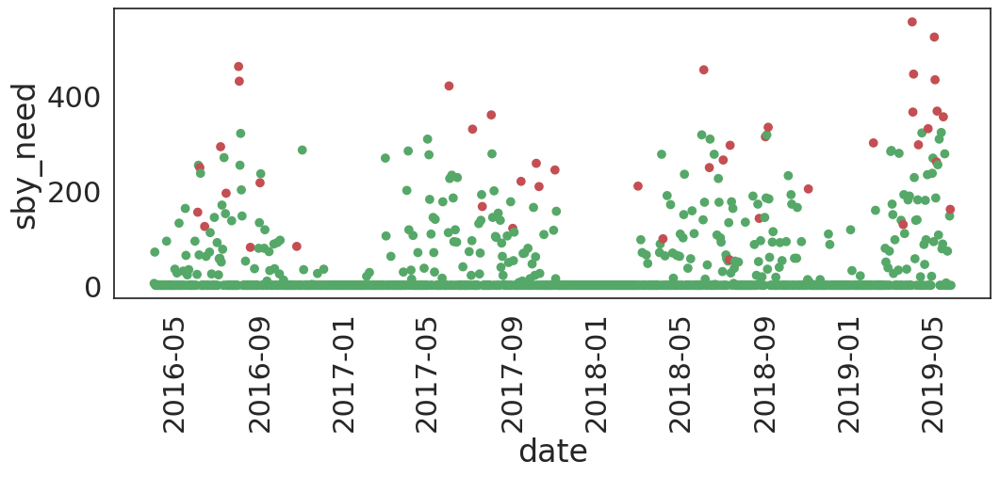

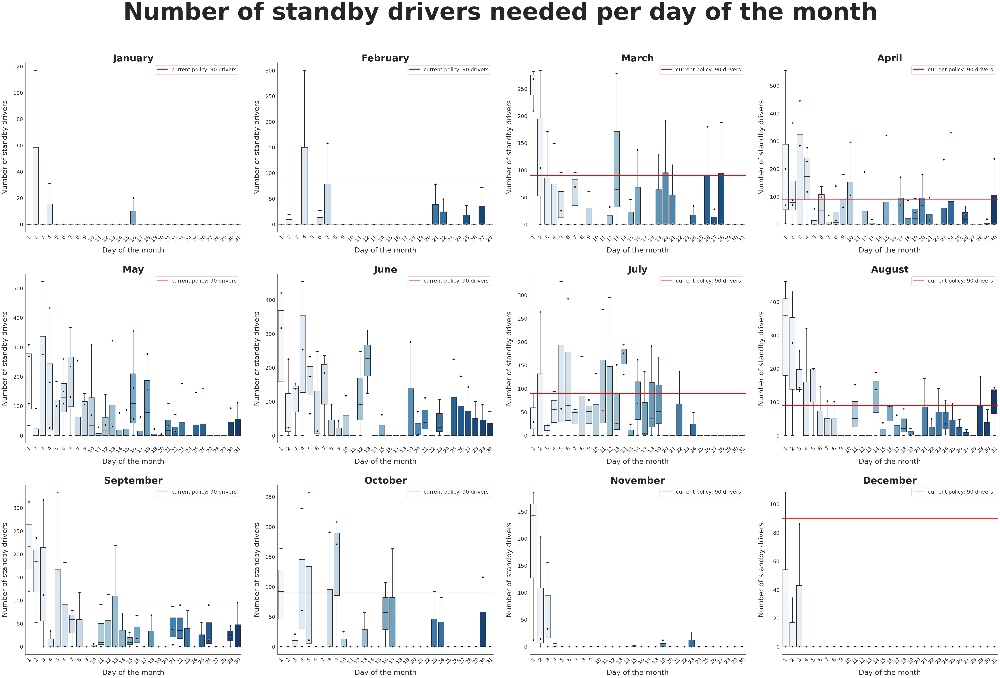

In [38]:
knn_model = KNN(n_neighbors = 3, method = "mean") #different method
knn_df = fit_model(knn_model, data)
plot_anomalies(knn_df)
plot_anomalies_stratified(knn_df)

does the general trend stay the same if we exclude all outliers?

In the next plot, I exluded the datapoints that would be considered outliers.

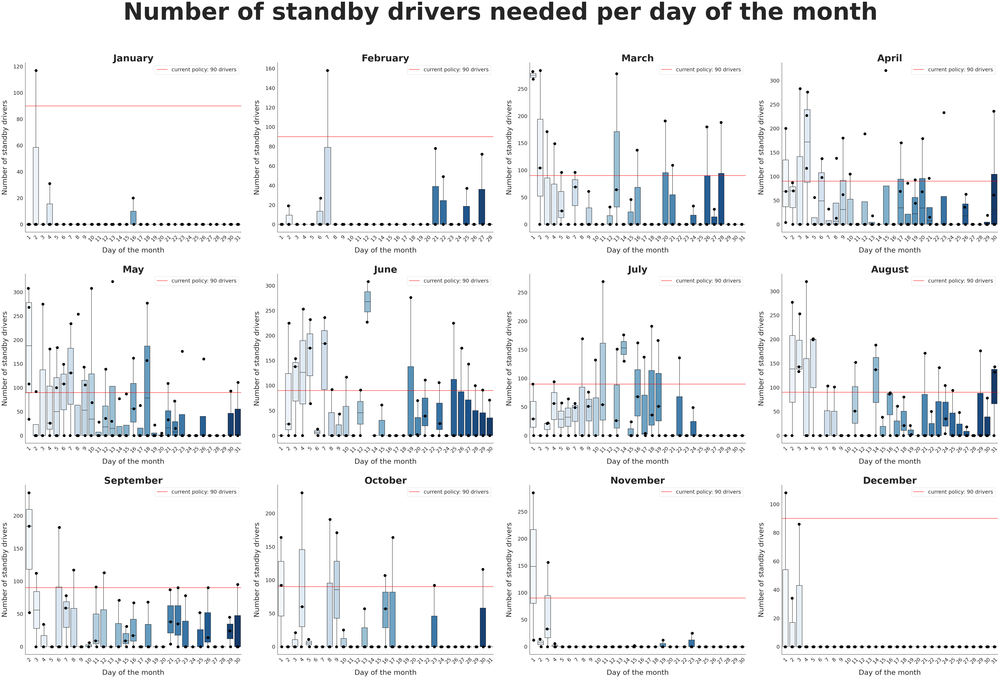

In [21]:
knn_filtered = knn_df[knn_df["Predictions"] < 1] 

plot_stratified_month(knn_filtered)

The beginnings of come months change quite considerably, such as June and July.

I'll be trying different approaches next

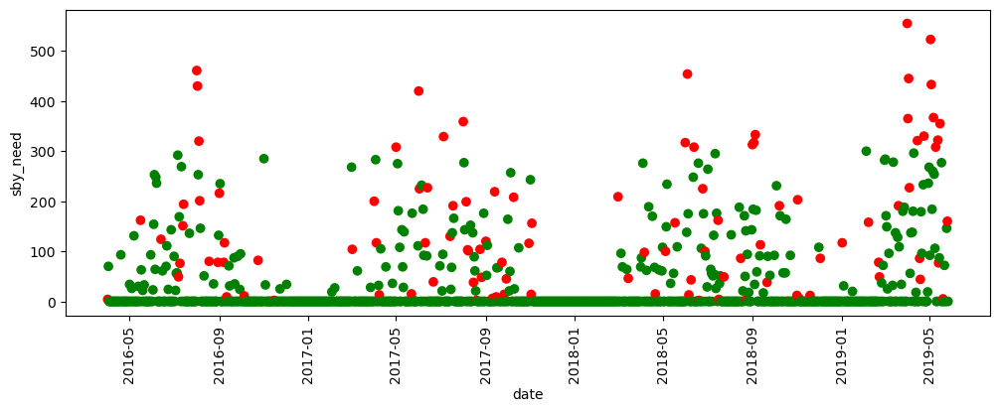

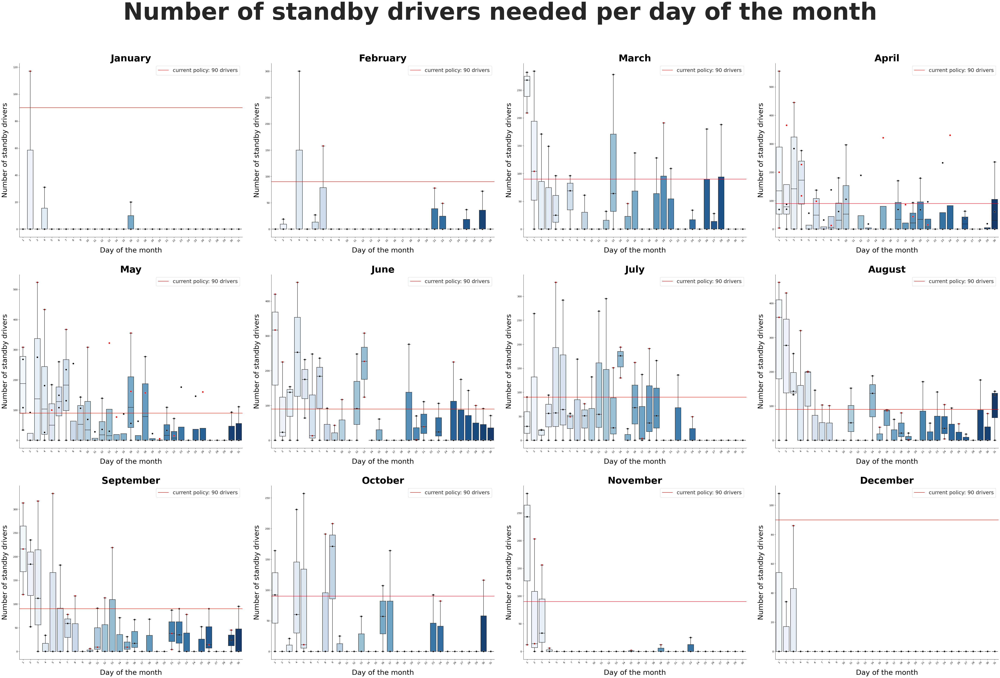

In [53]:
lof_model = LOF()
lof_df = fit_model(lof_model, data)
plot_anomalies(lof_df)
plot_anomalies_stratified(lof_df)

data when filtered next

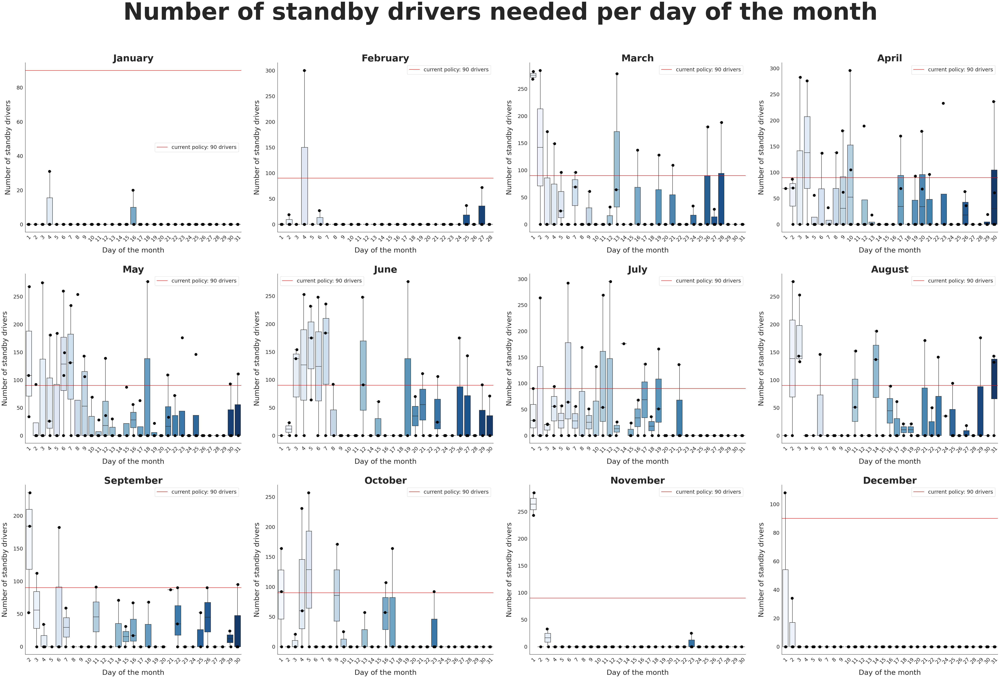

In [54]:
lof_filtered = lof_df[lof_df["Predictions"] < 1] 

plot_stratified_month(lof_filtered)


using the default lof outlier detection may penalize the beginning of each month quite harshly which may not be desirable.

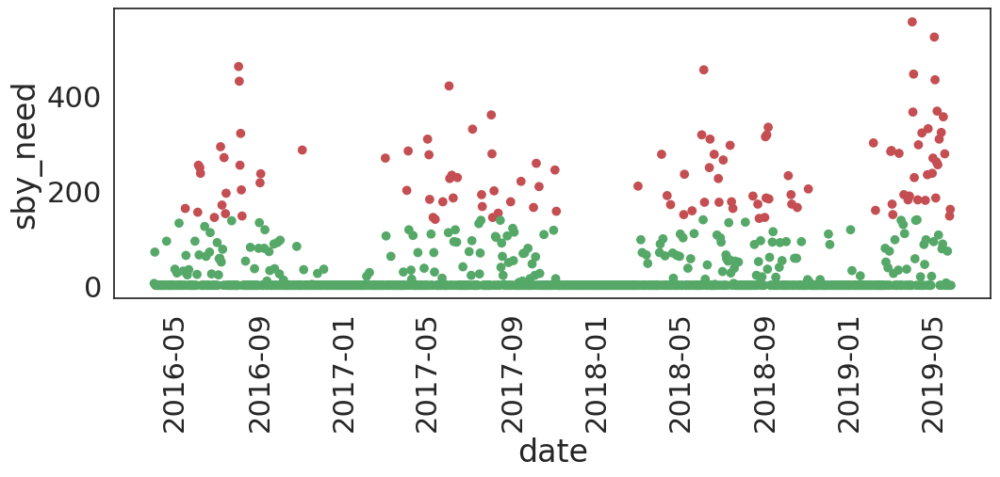

In [55]:
# the ecod requires you to specify the level of contamination, 
# i.e., your assumption of how much percent of your data are outliers.
# default is 0.1
ecod_model = ECOD(contamination = 0.1) 
ecod_df = fit_model(ecod_model, data)
plot_anomalies(ecod_df)

data when filtered next

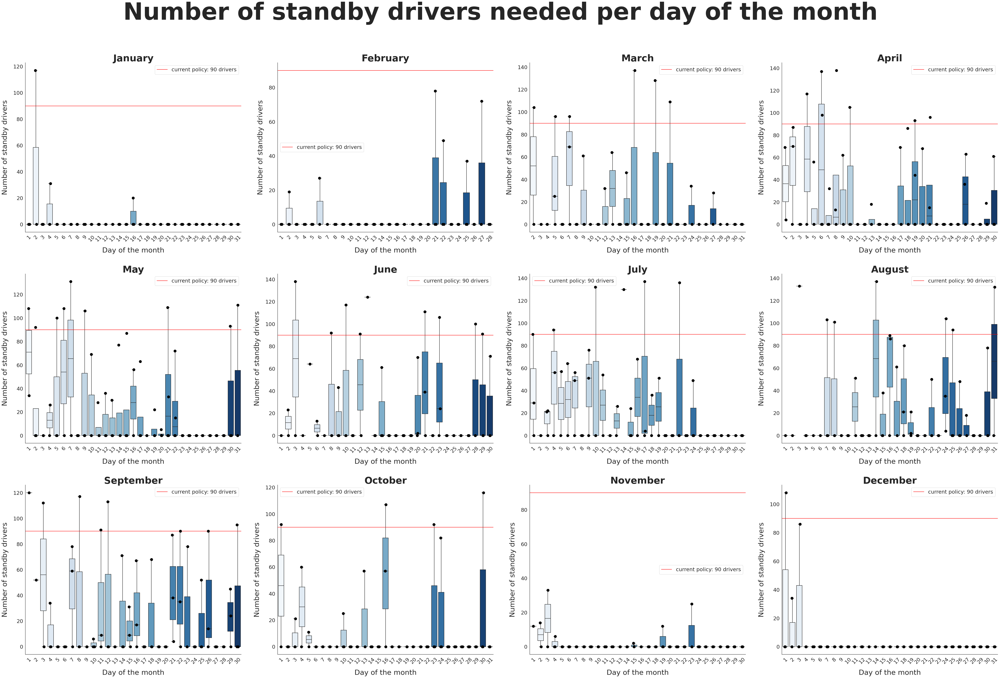

In [56]:
ecod_filtered = ecod_df[ecod_df["Predictions"] < 1] 

plot_stratified_month(ecod_filtered)

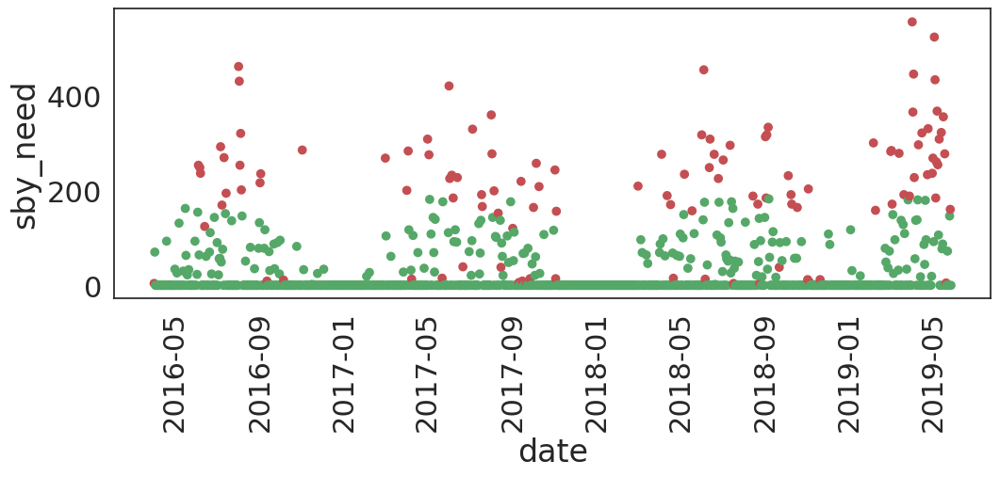

In [57]:
# the iforest requires you to specify the level of contamination, 
# i.e., your assumption of how much percent of your data are outliers.
# default is 0.1
iforest_model = IForest(contamination = 0.1) 
iforest_df = fit_model(iforest_model, data)
plot_anomalies(iforest_df)

data when filtered next

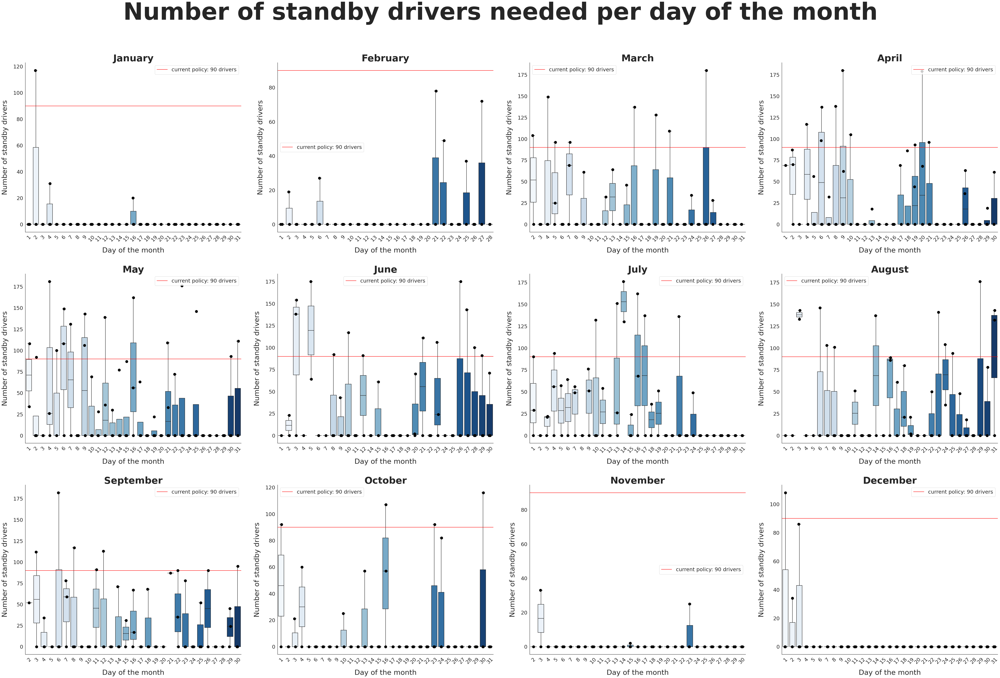

In [58]:
iforest_filtered = iforest_df[iforest_df["Predictions"] < 1] 

plot_stratified_month(iforest_filtered)


None of these methods in their default state really perform that well as they all crush down the beginning of the month.

Moreover, while those methods are unsupervised outlier detection methods, they all require the specification of a contamination parameter which specifies the proportion of outliers in the data.
Naturally, this parameter has to be chosen carefully as it will deeply affect the performance of the outlier detection.
Preferentially, this parameter should be chosen together with a domain expert.
On the other hand, sensitivity analyses could be performed at the end, in which models are trained for several levels of assumed contamination separately and subsequently compared in performance.

For now, however, I will not delete any datatpoints as I fear I could delete datapoints that are actually part of the data generating process. 

Finally, another option that kind of combines the idea of removing extraordinarily high datapoints from the data while keeping the information that there has been high demand somewhere around the timepoint where the datapoint has been removed  is to use smoothing approaches, such as moving average (MA). 
Here, each datapoint is replaced by the average of itself and its neighbors, where the number of neighbors to be included in the average can be specified. 

The next few figures show how the MA operation alters the data, when data from +- 1 or +- 3 days is averaged (one-day MA and one-week MA, respectively).


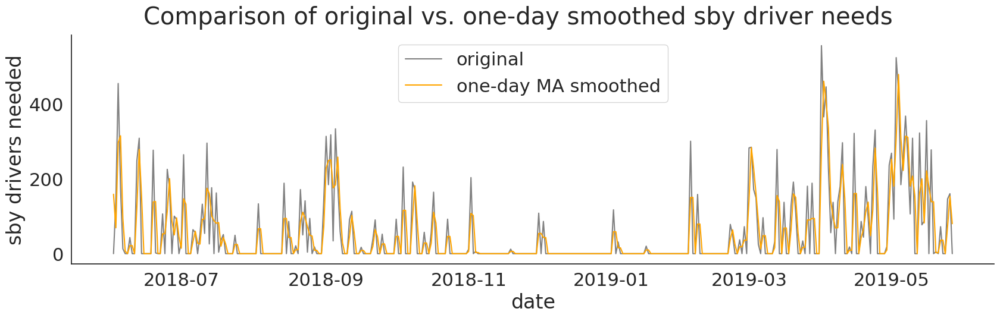

In [54]:
data["sby_need_MA_oneday"] = data.sby_need.rolling(window = 1, center = True, closed = "both", min_periods = 1).mean()


fig, ax = plt.subplots(figsize = (20, 5))

last_year = data[data.date > "2018-06-01"]

sns.lineplot(data = last_year, 
             x = "date", 
             y = "sby_need", 
             color = "grey",
             ax = ax,
            label = "original")

sns.lineplot(data = last_year, 
             x = "date", 
             y = "sby_need_MA_oneday", 
             color = "orange", 
             ax = ax,
            label = "one-day MA smoothed")

ax.set_ylabel("sby drivers needed")

fig.suptitle("Comparison of original vs. one-day smoothed sby driver needs")

sns.despine()

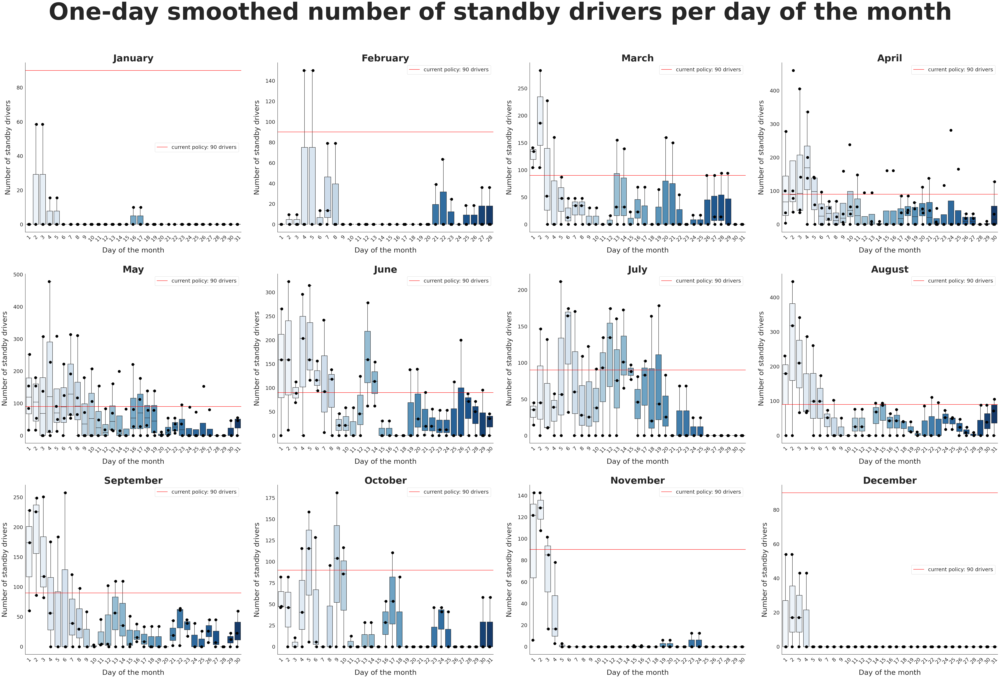

In [55]:

plot_stratified_month(data, y = "sby_need_MA_oneday", 
                      suptitle = "One-day smoothed number of standby drivers per day of the month")


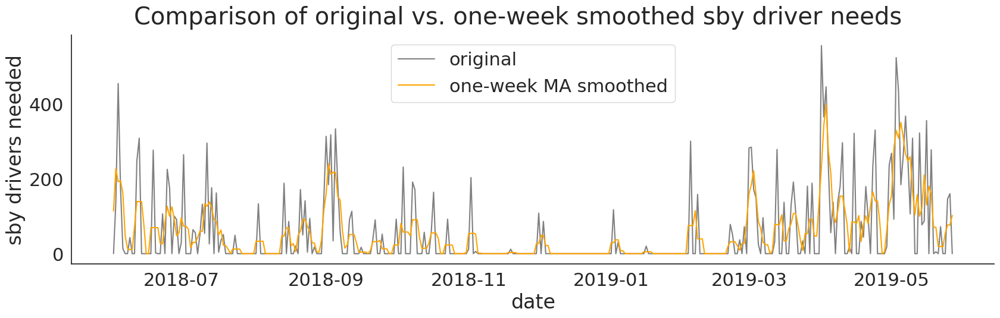

In [56]:
data["sby_need_MA_oneweek"] = data.sby_need.rolling(window = 3, center = True, closed = "both", min_periods = 1).mean()

fig, ax = plt.subplots(figsize = (20, 5))

last_year = data[data.date > "2018-06-01"]

sns.lineplot(data = last_year, 
             x = "date", 
             y = "sby_need", 
             color = "grey",
             ax = ax,
            label = "original")

sns.lineplot(data = last_year, 
             x = "date", 
             y = "sby_need_MA_oneweek", 
             color = "orange", 
             ax = ax,
            label = "one-week MA smoothed")

ax.set_ylabel("sby drivers needed")

fig.suptitle("Comparison of original vs. one-week smoothed sby driver needs")

sns.despine()

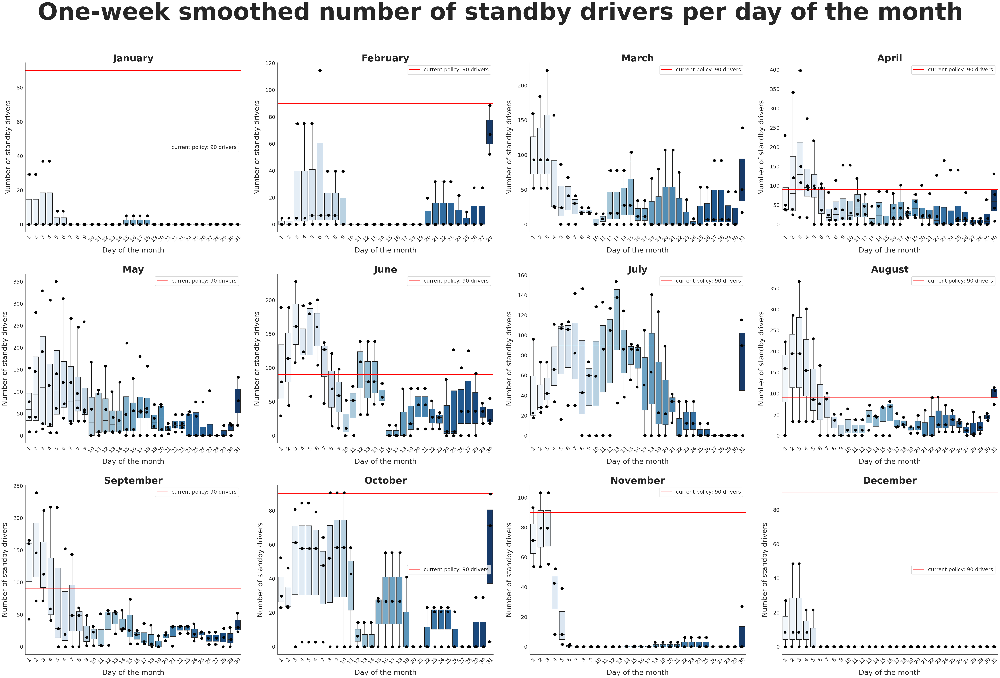

In [57]:

plot_stratified_month(data, y = "sby_need_MA_oneweek", 
                      suptitle = "One-week smoothed number of standby drivers per day of the month")

Inherently, smoothing reduces the "noise" in the data.
Further, MA approaches go hand in hand with feature engineering as regressors can be trained on smoothed timeseries instead of the original "noisier" ones which could help regressors in producing better forecasts.

Therefore, training models on smoothed timeseries will also be considered in the modeling process.

The story continues in the statsforecast_modeling notebook.